# SaRNet: A Dataset for Deep Learning Assisted Search and Rescue with Satellite Imagery


**Abstract**

 Access to high resolution satellite imagery has dramatically increased in recent years as several new constellations have entered service. High revisit frequencies as well as improved resolution has widened the use cases of satellite imagery to areas such as humanitarian relief and even Search and Rescue (SaR). We propose a novel remote sensing object detection dataset for deep learning assisted SaR. This dataset contains only very small objects that have been identified as potential targets in a live search and rescue scenario. We evaluate the application of popular object detection frameworks to this dataset as a baseline to inform further research. We also propose a novel object detection metric, specifically designed to be used in a deep learning assisted SaR setting. 

## Download the data

In [ ]:
!wget https://michaeltpublic.s3.amazonaws.com/sarnet.zip

In [2]:
!unzip -q -o sarnet.zip 

# Download the trained model

In [ ]:
!wget https://michaeltpublic.s3.amazonaws.com/sarnet_FPN.pth

## Install Dependencies

In [ ]:
# installing detectron2 with torch version 1.9
import torch
assert torch.__version__.startswith("1.9")   # check the torch version is the default, this may require changing in the future

!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.9/index.html

# you can ignore the warning to restart

# Setup Detectron2

In [5]:
%matplotlib inline
import glob
import matplotlib.pyplot as plt
import random, cv2

import detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.data.datasets import register_coco_instances
from detectron2.data import MetadataCatalog, DatasetCatalog


# registed datasets for detectron
try:
  register_coco_instances("dataset_test_1", {}, "/content/dataset/annotations/test.json", "/content/dataset/test")
except AssertionError:
  print("INFO: Datasets already registered.")

# get the metadata
para_metadata_test = MetadataCatalog.get("dataset_test_1")
dataset_dicts_test = DatasetCatalog.get("dataset_test_1")


# config
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.MODEL.RPN.IOU_THRESHOLDS = [0.2, 0.4]
cfg.MODEL.WEIGHTS = "sarnet_FPN.pth"  # path to the model
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.3   # set a custom testing threshold
cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.1
predictor = DefaultPredictor(cfg)

## Inference

/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


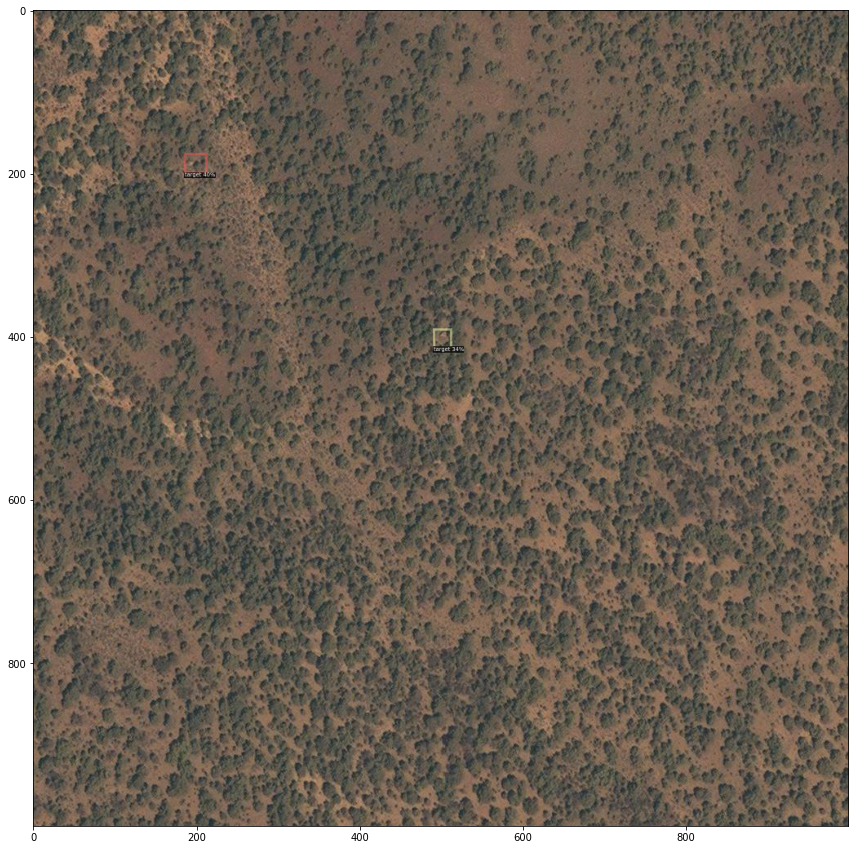

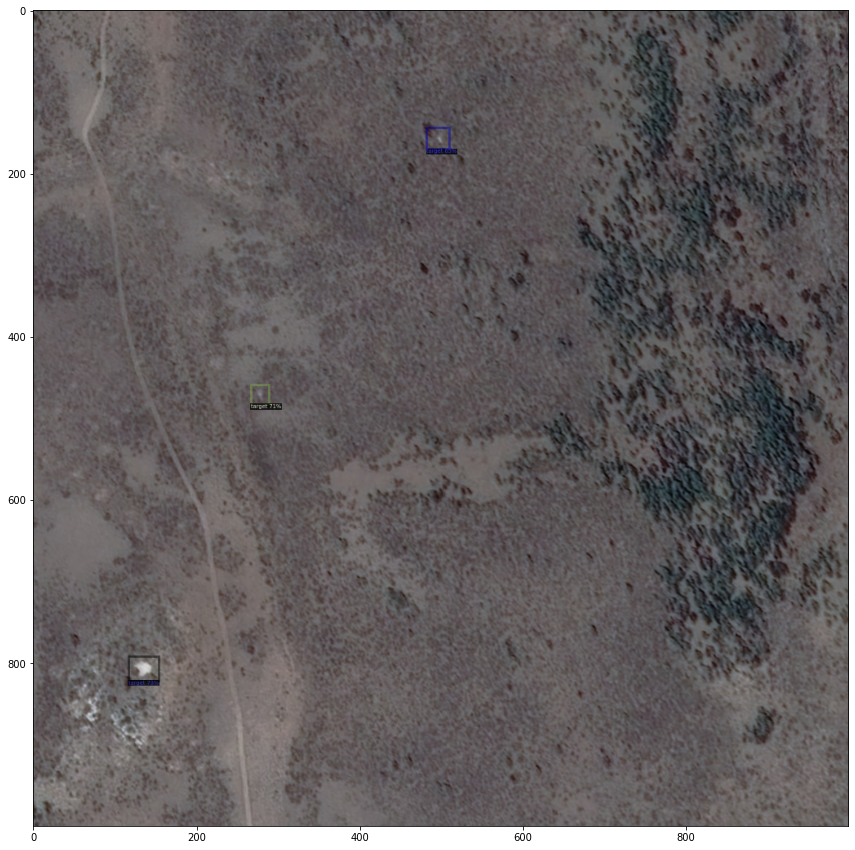

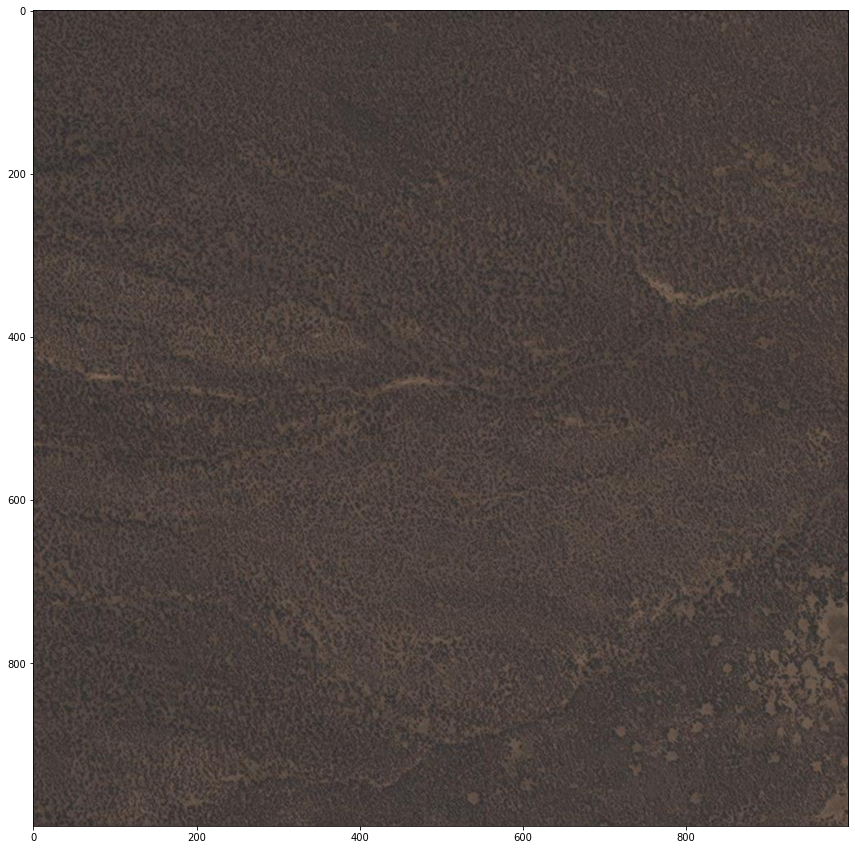

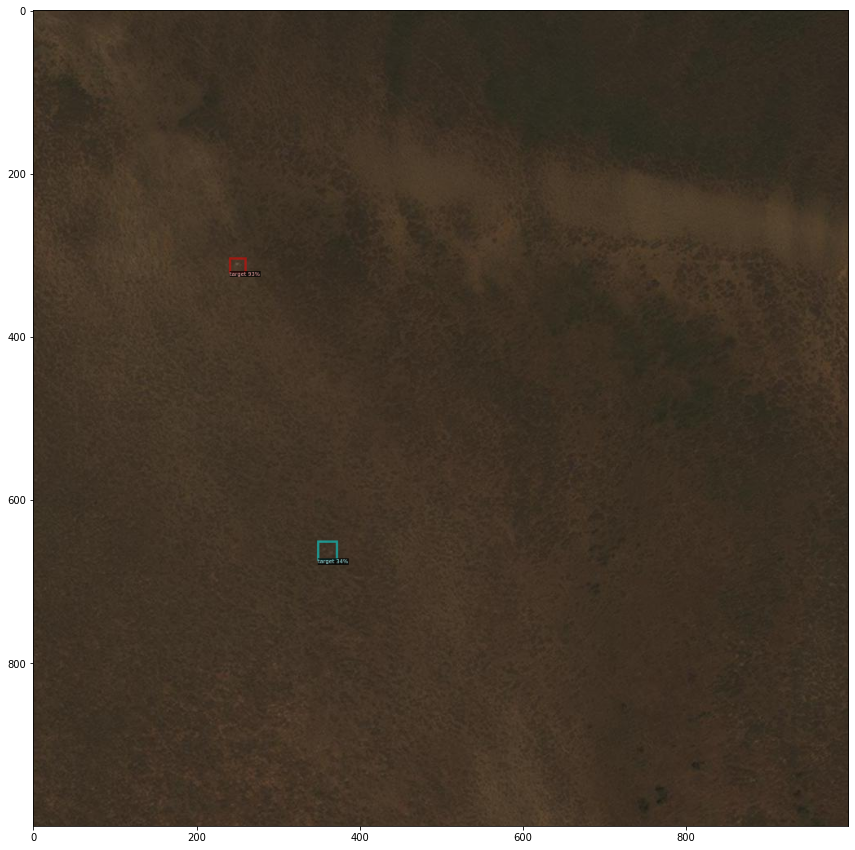

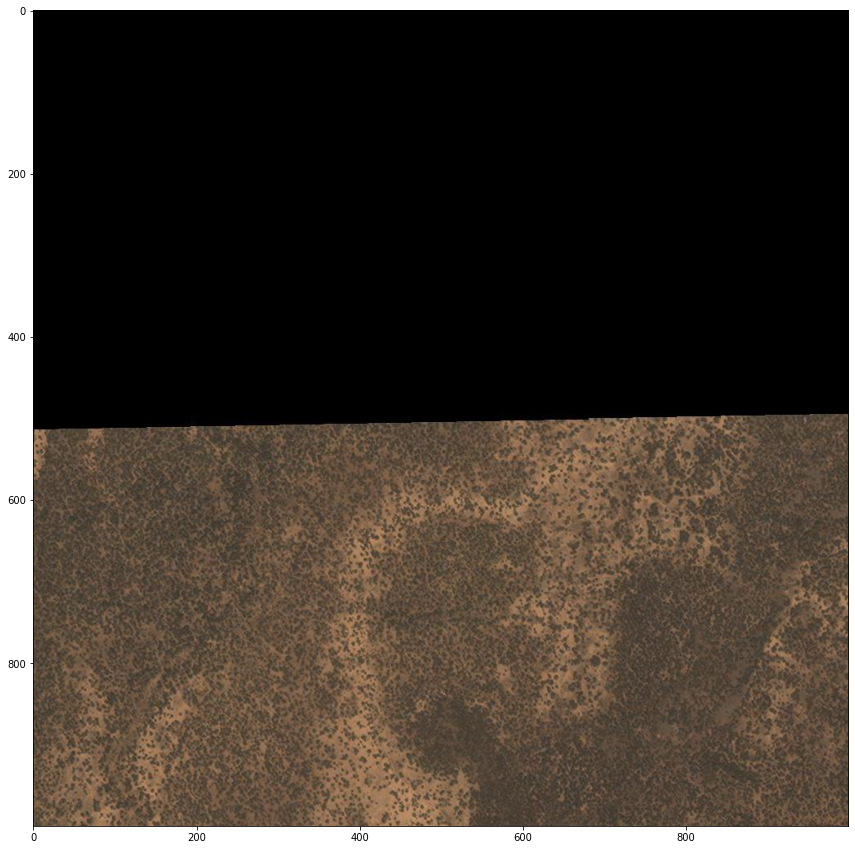

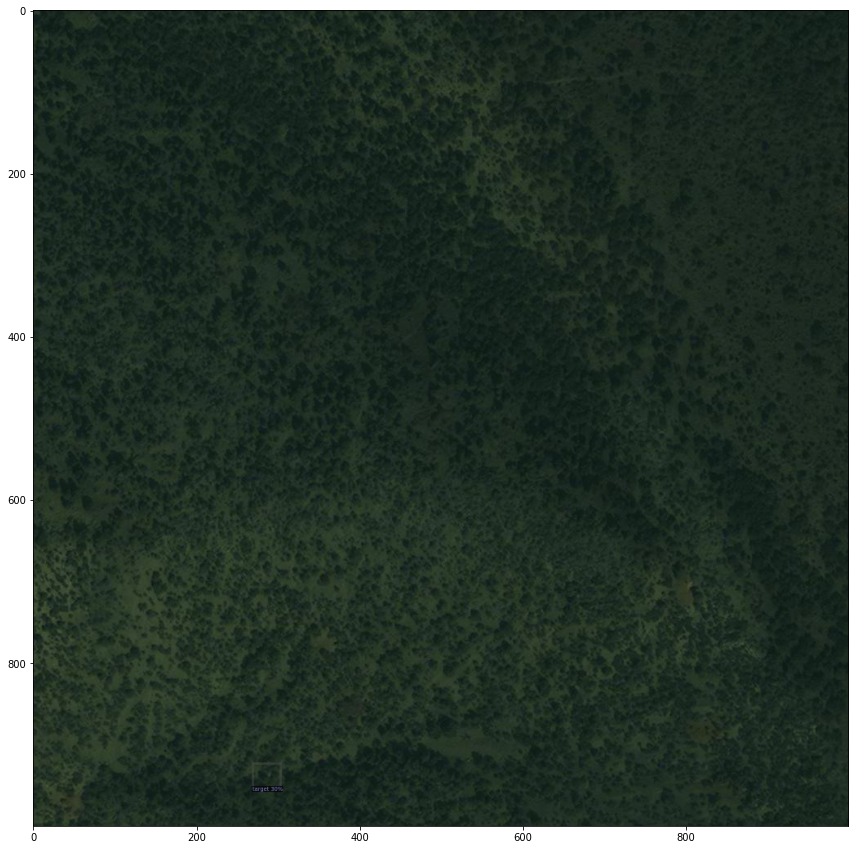

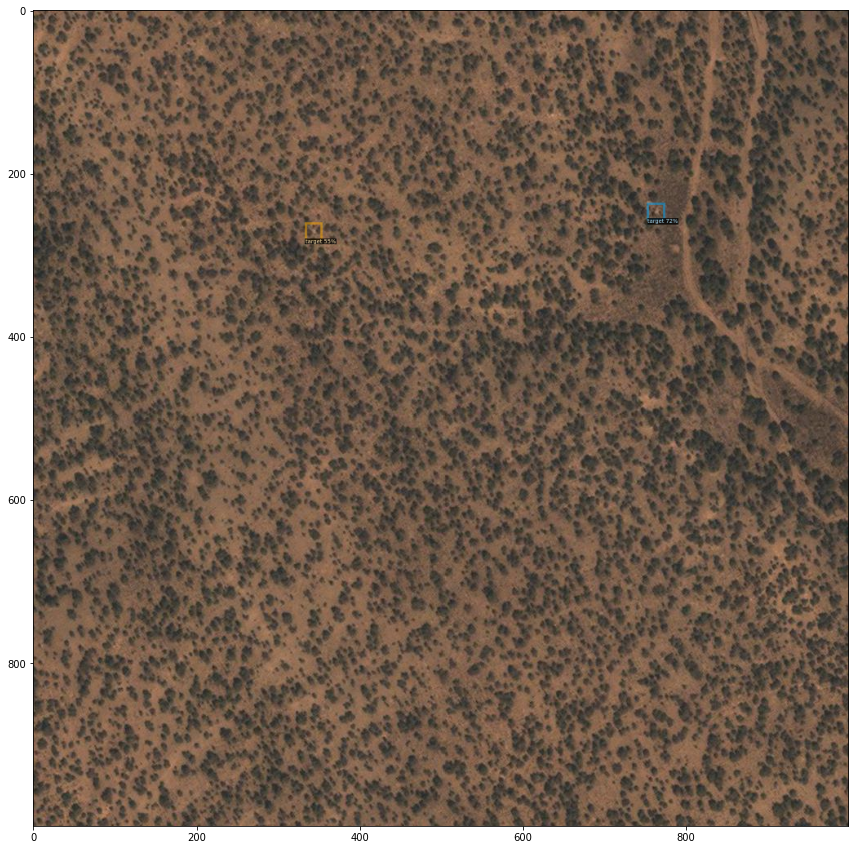

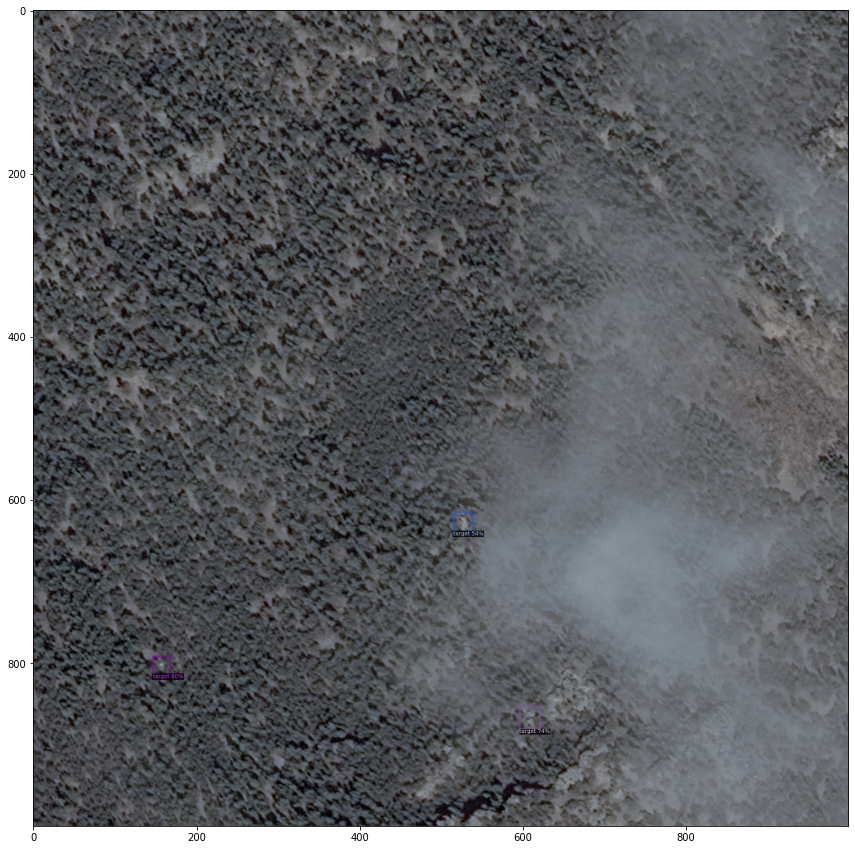

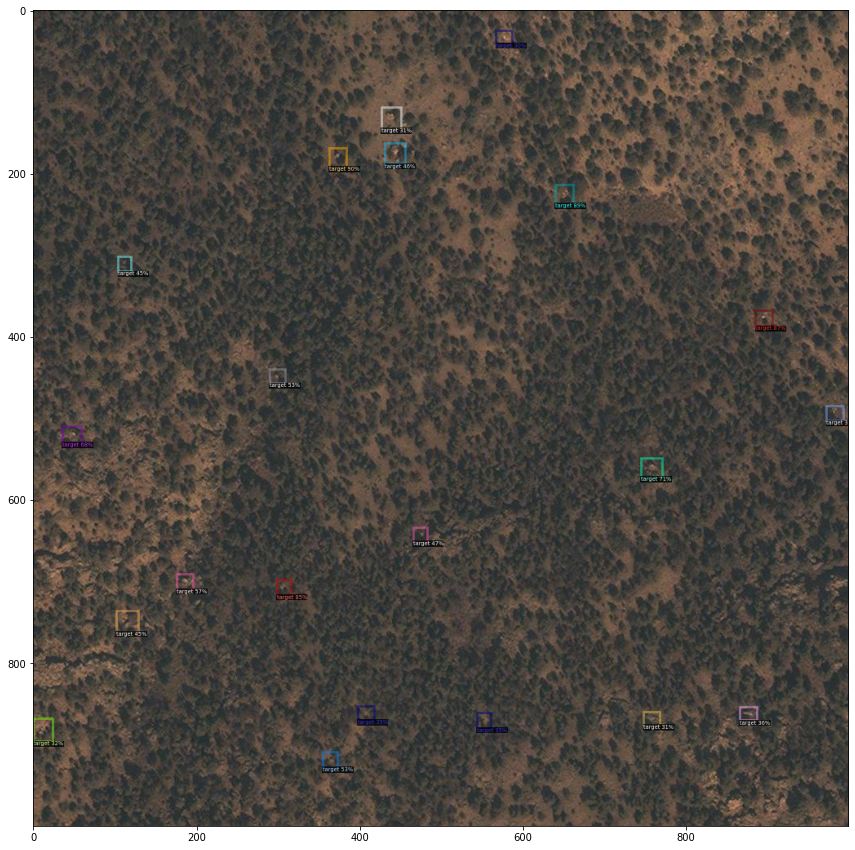

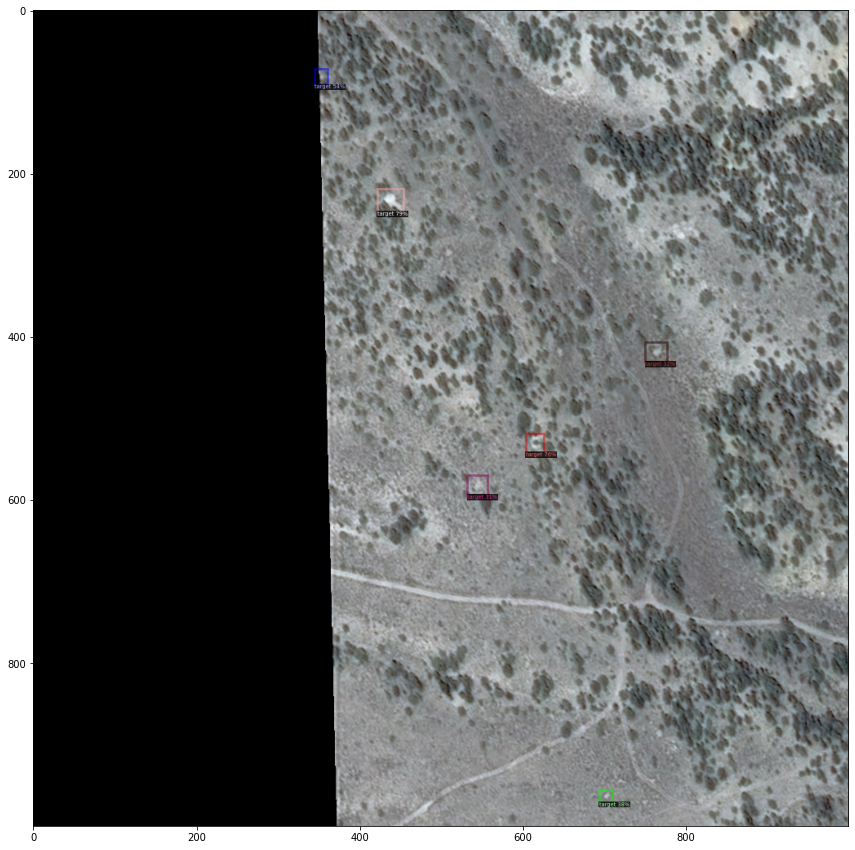

In [6]:
import os
if not os.path.exists("output"):
  os.makedirs("output")

fileList = glob.glob("dataset/test/*.jpg")
for fileName in random.sample(fileList, 10):
  
  # read the image
  img = cv2.imread(fileName)
  
  # get predictions
  outputs = predictor(img)

  # convert image for display only
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  v = Visualizer(img[:, :, ::-1], para_metadata_test)
  v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  fig = plt.figure(figsize=(15,15))
  plt.imshow(v.get_image()[:, :, ::-1])

  # save the image
  output_img = cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_RGB2BGR)
  cv2.imwrite("output/" + fileName.split("/")[-1], output_img)